## 1. Defining the question

###a) Specify the question
Build a model that determines whether an email is spam or not.

###b) Defining the Metrics for success
i. To build an email classifier that distinguishes spam and ham with an f1score of 85+ %

ii. To identfy the most important features in indentifying spam messages

iii. To identify the ideal training_test split size for the best model accuracy.

### c) Understanding the context
Emergence of the internet transformed communication patterns with emails emerging as the pioneer of modern day social media. Since its inception in 1971, emails continue to be one of the most popular communication platforms. For all of its success, the sector has its fair share of challenges. 
According to Nikola Budanovic, an estimated 69.32 billion email messages are sent each day with nearly 45 % of these being spam (2019). The wide reach of emails has meant that advertisers have found a viable channel to reach a wide range of users at very low costs and this has contributed to the misuse of personal emails. An example of this misuse is the fact that 35% of all spam messages are advertisements while 31% of these are adult-related content making spam emails a huge inconvenience at the workplace and even at home (Budanovic, 2019).

As a solution, this project examines pre-classified messages to identify patterns in the emails that enable it to predict the class of a message given its content. This project is not only useful in ensuring email users receive ideal content, it also protects users from cons that take advantage of gullible users through false advertising.

### d) Recording the experimental design
For this experiemnt, I will:
*   Load and preview the data set
*   Prepare the data
*   Perform Exploratory Data Analysis i.e Univariate, Bivariate and Multivariate analysis 
*   Train the model (Naive Bayes)
*   Evaluate and optimize the model (Cross-validation & Removing correlated features)
*   Draw conclusions and make recommendations


### e) Data Relevance
To build a spam filter, one needs a preclassfied data set with old messages. The data set provided for this project is relevant since it includes the frequencies of different words along with the classess of those messages.

## 2. Importing Libraries

In [ ]:
!pip install -U pandas-profiling

In [ ]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

## 3. Reading and Checking the Data

In [3]:
# load the data set
base = pd.read_csv('spambase.csv')

# preview first five rows
base.head()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
0,0.00,0.64,0.64,0.0,0.32,0.00,0.00,0.00,0.00,0.00,0.00,0.64,0.00,0.00,0.00,0.32,0.00,1.29,1.93,0.00,0.96,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.000,0.0,0.778,0.000,0.000,3.756,61,278,1
1,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,0.21,0.79,0.65,0.21,0.14,0.14,0.07,0.28,3.47,0.00,1.59,0.0,0.43,0.43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.07,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.132,0.0,0.372,0.180,0.048,5.114,101,1028,1
2,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,0.38,0.45,0.12,0.00,1.75,0.06,0.06,1.03,1.36,0.32,0.51,0.0,1.16,0.06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.06,0.0,0.0,0.12,0.0,0.06,0.06,0.0,0.0,0.01,0.143,0.0,0.276,0.184,0.010,9.821,485,2259,1
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.137,0.0,0.137,0.000,0.000,3.537,40,191,1
4,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.135,0.0,0.135,0.000,0.000,3.537,40,191,1


In [4]:
# preview last five rows
base.tail()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
4596,0.31,0.0,0.62,0.0,0.00,0.31,0.0,0.0,0.0,0.0,0.0,1.88,0.00,0.0,0.0,0.0,0.0,0.0,0.62,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.31,0.31,0.31,0.0,0.0,0.000,0.232,0.0,0.000,0.0,0.0,1.142,3,88,0
4597,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,6.00,0.0,2.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,2.00,0.0,0.0,0.000,0.000,0.0,0.353,0.0,0.0,1.555,4,14,0
4598,0.30,0.0,0.30,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1.80,0.30,0.0,0.0,0.0,0.0,0.9,1.50,0.0,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,1.20,0.0,0.0,0.102,0.718,0.0,0.000,0.0,0.0,1.404,6,118,0
4599,0.96,0.0,0.00,0.0,0.32,0.00,0.0,0.0,0.0,0.0,0.0,0.32,0.00,0.0,0.0,0.0,0.0,0.0,1.93,0.0,0.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.32,0.00,0.32,0.0,0.0,0.000,0.057,0.0,0.000,0.0,0.0,1.147,5,78,0
4600,0.00,0.0,0.65,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.65,0.0,0.0,0.0,0.0,0.0,4.60,0.0,0.65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1.97,0.65,0.0,0.0,0.000,0.000,0.0,0.125,0.0,0.0,1.250,5,40,0


In [5]:
# checking the number of rows and columns
base.shape

(4601, 58)

The data set had 4,601 rows and 58 columns.

In [6]:
# checking general information
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4601 entries, 0 to 4600
Data columns (total 58 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   word_freq_make              4601 non-null   float64
 1   word_freq_address           4601 non-null   float64
 2   word_freq_all               4601 non-null   float64
 3   word_freq_3d                4601 non-null   float64
 4   word_freq_our               4601 non-null   float64
 5   word_freq_over              4601 non-null   float64
 6   word_freq_remove            4601 non-null   float64
 7   word_freq_internet          4601 non-null   float64
 8   word_freq_order             4601 non-null   float64
 9   word_freq_mail              4601 non-null   float64
 10  word_freq_receive           4601 non-null   float64
 11  word_freq_will              4601 non-null   float64
 12  word_freq_people            4601 non-null   float64
 13  word_freq_report            4601 

All the columns have a numeric data type.

## Tidy the data set

In [7]:
# Check for duplicates
base.duplicated().sum()

391

The data set has 391 duplicate values which I dropped.

In [8]:
# Drop duplicates
base = base.drop_duplicates(keep='first')
base.duplicated().sum()

0

Since we are working with frequencies, I will assume that the email messages that were tokenized to build this data set had 100 words each in order to get an understanding of the most common or least common.

In [9]:
# Select rows with word frequencies
base.iloc[:, :-4] = round(base.iloc[:, :-4] * 100) # to use whole numbers
base.head()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
0,0.0,64.0,64.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,64.0,0.0,0.0,0.0,32.0,0.0,129.0,193.0,0.0,96.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,78.0,0.0,0.0,3.756,61,278,1
1,21.0,28.0,50.0,0.0,14.0,28.0,21.0,7.0,0.0,94.0,21.0,79.0,65.0,21.0,14.0,14.0,7.0,28.0,347.0,0.0,159.0,0.0,43.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,0.0,37.0,18.0,5.0,5.114,101,1028,1
2,6.0,0.0,71.0,0.0,123.0,19.0,19.0,12.0,64.0,25.0,38.0,45.0,12.0,0.0,175.0,6.0,6.0,103.0,136.0,32.0,51.0,0.0,116.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,12.0,0.0,6.0,6.0,0.0,0.0,1.0,14.0,0.0,28.0,18.0,1.0,9.821,485,2259,1
3,0.0,0.0,0.0,0.0,63.0,0.0,31.0,63.0,31.0,63.0,31.0,31.0,31.0,0.0,0.0,31.0,0.0,0.0,318.0,0.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,14.0,0.0,0.0,3.537,40,191,1
4,0.0,0.0,0.0,0.0,63.0,0.0,31.0,63.0,31.0,63.0,31.0,31.0,31.0,0.0,0.0,31.0,0.0,0.0,318.0,0.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,14.0,0.0,0.0,3.537,40,191,1


## Exploratory Data Analysis

### Univariate Analysis

In [10]:
# Get statistical description of the data
base.describe()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
count,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.00000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000,4210.000000
mean,10.436580,11.265558,29.147268,6.307838,32.532067,9.665558,11.747506,10.800000,9.185986,24.842043,5.668646,56.520428,9.765558,6.12114,4.480285,25.382898,14.915439,18.875534,171.836817,8.496200,81.004038,13.158670,10.062233,9.096912,57.399525,27.933017,36.983848,12.857482,9.838242,10.377910,6.354394,4.491686,10.233254,4.577672,10.788124,9.936817,14.348219,1.419002,8.405701,6.127791,4.143230,14.154157,4.877197,8.526603,32.012352,18.937530,0.578622,3.474584,4.040143,14.399525,1.736105,28.106413,7.600713,4.576010,5.383896,52.139905,291.181948,0.398812
std,30.000489,45.426003,51.571854,135.248680,68.780519,27.603027,39.728368,41.028242,28.214379,65.663849,18.416660,88.251305,30.930933,34.60657,24.218598,79.753446,45.766905,54.113335,176.875992,50.558277,114.935212,107.125832,35.133637,43.172252,167.653874,90.555259,177.533029,53.542935,57.679641,43.956845,38.726739,30.074818,56.914567,30.181210,53.026280,38.647026,42.450809,23.051199,44.799124,31.951984,31.817715,79.380350,23.187131,64.609597,104.591440,92.830774,7.917045,29.852109,25.247571,27.423303,10.570806,84.330162,23.961995,43.595732,33.147358,199.582168,618.654838,0.489712
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.627500,7.000000,40.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,136.00

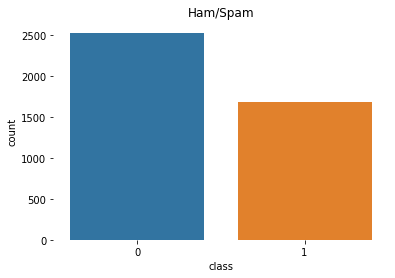

In [11]:
# checking class distribution
sns.countplot(x='class', data=base)
sns.despine(top=True, left=True, bottom=True, right=True)
plt.title('Ham/Spam')
plt.show()

The data set has more ham(0) than spam(1) messages.

In [12]:
# Create a totals row for word frequencies
word_freqs = base.iloc[:, :-4]

word_freqs = word_freqs.append(word_freqs.sum(numeric_only=True), ignore_index=True)
totals = pd.DataFrame(word_freqs.iloc[4210, :])
totals.columns = ['Totals']

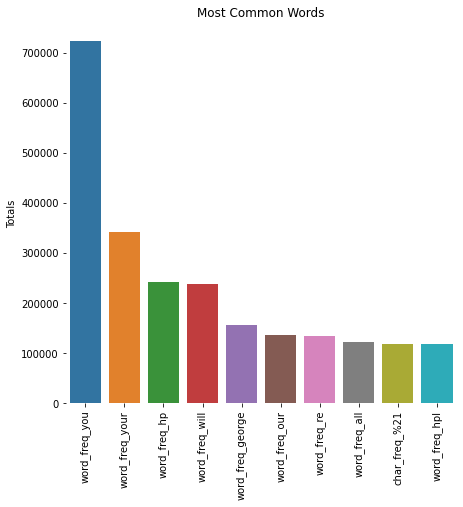

In [13]:
# Plot most common words
totals = totals.sort_values(by='Totals', ascending=False)
top = totals.head(10)
top_10 = totals.head(10).index
plt.figure(figsize=(7,7))
sns.barplot(y='Totals', x=top_10, data=top)
plt.xticks(rotation=90)
sns.despine(top=True, left=True, bottom=True, right=True)
plt.title('Most Common Words')
plt.show()

The most common words the data set are 'you', 'your', 'hp', 'will', 'george', 'our', 're', 'all', '%21', and 'hpl'.

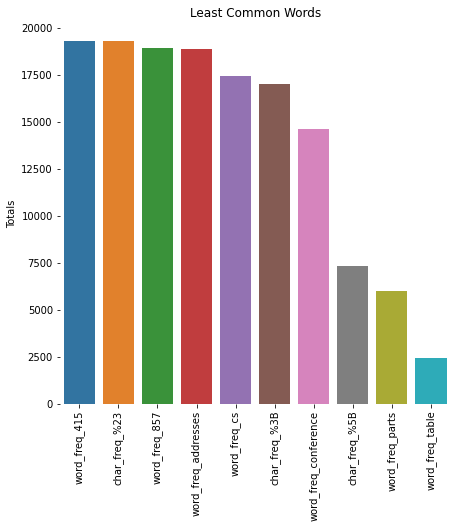

In [14]:
# Plot least common words
bottom = totals.tail(10)
bottom_10 = totals.tail(10).index
plt.figure(figsize=(7,7))
sns.barplot(y='Totals', x=bottom_10, data=bottom)
plt.xticks(rotation=90)
sns.despine(top=True, left=True, bottom=True, right=True)
plt.title('Least Common Words')
plt.show()

The most least common words are '415', '%23', '857', 'addressess', 'cs', '%3B', 'onference', '%5B', 'parts', and 'table'.

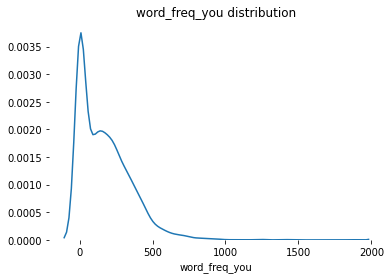

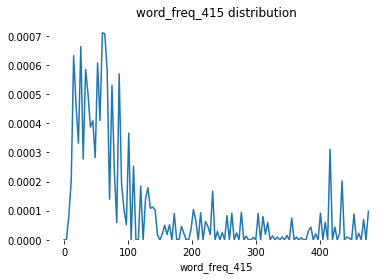

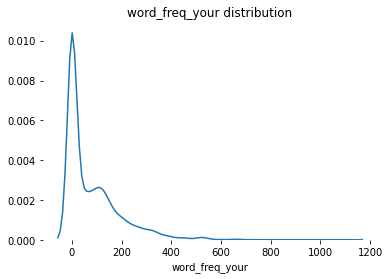

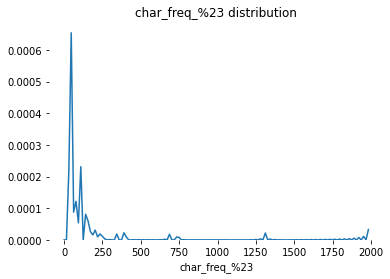

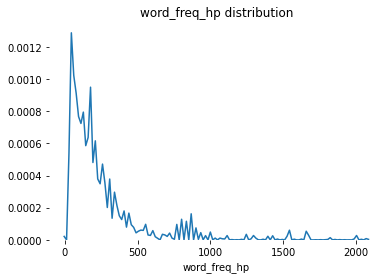

...

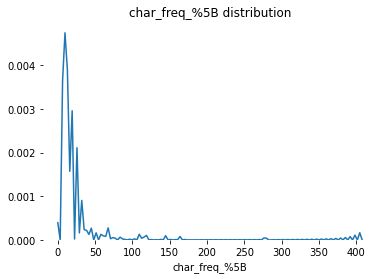

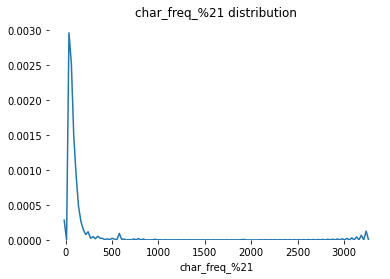

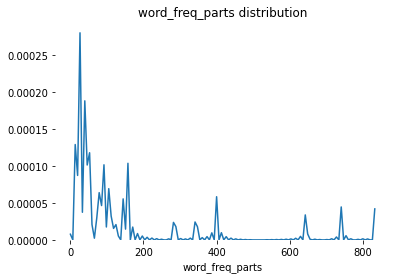

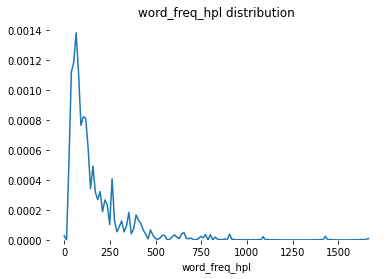

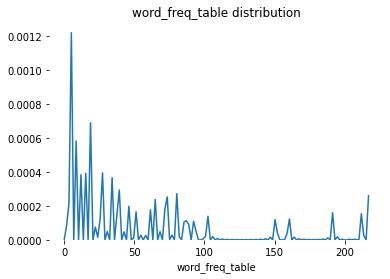

In [15]:
# Check distribution of most common and least common words
columns = ['word_freq_you' , 'word_freq_415', 'word_freq_your' , 'char_freq_%23',
       'word_freq_hp' , 'word_freq_857', 'word_freq_will' , 'word_freq_addresses',
       'word_freq_george' , 'word_freq_cs', 'word_freq_our' , 'char_freq_%3B',
       'word_freq_re' , 'word_freq_conference', 'word_freq_all' , 'char_freq_%5B',
       'char_freq_%21' , 'word_freq_parts', 'word_freq_hpl' , 'word_freq_table']
for col in columns:
  sns.distplot(base[col], kde=True, hist=False)
  dist_title = col + ' distribution'
  plt.title(dist_title)
  sns.despine(left=True, bottom=True)
  plt.show()

Judging by the distribution plots, the frequency of occurence is skewed to the right suggesting the need for standardizing the features during modelling.

### Bivariate Analysis

<Figure size 1440x1224 with 0 Axes>

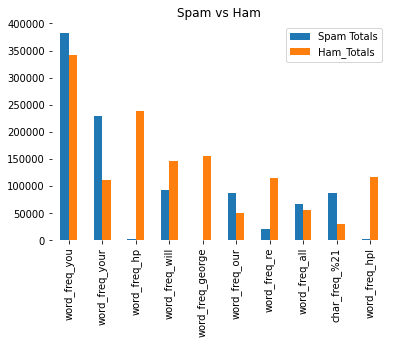

In [16]:
# Get the different classes
spam =  base.groupby(by='class').get_group(1)
ham = base.groupby(by='class').get_group(0)

# I will only include the top 10 most common words
ham_word_freqs = ham[['word_freq_you', 'word_freq_your', 'word_freq_hp', 'word_freq_will',
       'word_freq_george', 'word_freq_our', 'word_freq_re', 'word_freq_all',
       'char_freq_%21', 'word_freq_hpl']]
spam_word_freqs = spam[['word_freq_you', 'word_freq_your', 'word_freq_hp', 'word_freq_will',
       'word_freq_george', 'word_freq_our', 'word_freq_re', 'word_freq_all',
       'char_freq_%21', 'word_freq_hpl']]

ham_word_freqs = ham_word_freqs.append(ham_word_freqs.sum(numeric_only=True), ignore_index=True)
ham_totals = pd.DataFrame(ham_word_freqs.iloc[-1, :])
ham_totals.columns = ['Ham_Totals']

spam_word_freqs = spam_word_freqs.append(spam_word_freqs.sum(numeric_only=True), ignore_index=True)
spam_totals = pd.DataFrame(spam_word_freqs.iloc[-1, :])
spam_totals.columns = ['Spam Totals']


grouped_totals = pd.concat([spam_totals, ham_totals], 1)


# Plot grouped bar chart
plt.figure(figsize=(20, 17))
grouped_totals.plot(kind='bar',stacked=False, title='Spam vs Ham')
plt.xticks(rotation=90)
sns.despine(top=True, left=True, bottom=True, right=True)
plt.show()

### Multivariate Analysis

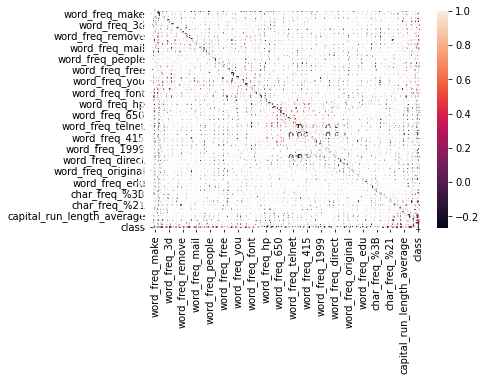

In [17]:
# Plot correlation matrix
sns.heatmap(base.corr(), annot=True)
plt.show()

Due to the large number of variables, I will examie the correlation between each variable and the class.

In [18]:
# Your data should be a pandas dataframe for this example
base.corrwith(base["class"]).sort_values(ascending=False)

class                         1.000000
word_freq_your                0.394392
word_freq_remove              0.334456
char_freq_%24                 0.326569
word_freq_000                 0.325716
word_freq_free                0.279261
word_freq_receive             0.272451
word_freq_business            0.260773
word_freq_you                 0.256242
char_freq_%21                 0.233782
capital_run_length_total      0.231671
word_freq_our                 0.230074
word_freq_order               0.221454
word_freq_over                0.212311
word_freq_money               0.205045
capital_run_length_longest    0.203657
word_freq_internet            0.200666
word_freq_email               0.188321
word_freq_credit              0.186074
word_freq_addresses           0.183849
word_freq_all                 0.172350
word_freq_mail                0.131686
word_freq_make                0.129194
word_freq_people              0.118024
capital_run_length_average    0.110274
word_freq_address        

Due to the large number of features, I will perform additional EDA for those that have the highest correlation with the target variable.

### Pandas Profile Report

In [19]:
# Selecting the most important features to examine
columns = ['class', 'word_freq_hp', 'word_freq_hpl', 'word_freq_your', 'word_freq_000', 'word_freq_remove', 'char_freq_%24', 
           'word_freq_you', 'word_freq_free', 'word_freq_business', 'word_freq_our', 'char_freq_%21', 'word_freq_receive',
           'word_freq_over', 'word_freq_order']

from pandas_profiling import ProfileReport
ProfileReport(base[columns], title = "Spam Base Report")

## Modelling

In [20]:
# Use TfidTransformer to scale frequencies
from sklearn.feature_extraction.text import TfidfTransformer

X = base.drop(['class', 'capital_run_length_average', 'capital_run_length_longest', 'capital_run_length_total'], 1)
y = base['class']

transformer = TfidfTransformer()
transformer.fit(X)

X = transformer.transform(X)

Since the data set that was provided already has frequencies of different words, The TfidfTransformer functions to scale down the impact of tokens that occur very frequently as was evidenced by their distribution plots in the univariate analysis and observations from the pandas profiing report.

### 80-20 Split

In [21]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=69)

In [22]:
# Initialize the classifier
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()

# Fit the model
model.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [23]:
# Evaluating the Model
predicted = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       482
           1       0.85      0.94      0.89       360

    accuracy                           0.90       842
   macro avg       0.90      0.91      0.90       842
weighted avg       0.91      0.90      0.91       842



Precision refers to the accuracy of positive predictions.

Recall refers to the fraction of positives that were correctly classified.

F1 score refers to the percentage of positives that were correctly predicted.

My model predicted 91% of the ham messages and 89% of the spam messages which is a very good score. 

### Performing Cross-validation and Grid-Search

In [24]:
# perform cross validation
from sklearn.model_selection import cross_val_score
all_accuracies = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5)
print(all_accuracies)
print('\n')
print('Cross validation scores mean:', all_accuracies.mean())

[0.90652819 0.88575668 0.90504451 0.8781575  0.91233284]


Cross validation scores mean: 0.8975639437215885


The mean accuracy score from the cross-validation using 5 folds is 0.897 with the highest cross-validation score being 0.912 which is higher than the 0.9 accuracy of my model suggesting I could achieve a higher score by varying my training and test sets. I will also explore other avenues of increasing my model's perfromance.

In [25]:
# Perform grid search
# Specify the parameters
grid_param = {
    'alpha': [1], # for laplace smoothing
    'fit_prior': [True, False],
}

from sklearn.model_selection import GridSearchCV
gd_sr = GridSearchCV(estimator=model,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=5)
# Fit the model
gd_sr.fit(X_train, y_train)
print(gd_sr.best_params_)

{'alpha': 1, 'fit_prior': True}


The best parameters are an alpha value of 1 for laplace smoothing and fit_prior as True.

In [26]:
# Make predictions using the best estimator
predicted = gd_sr.best_estimator_.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       482
           1       0.85      0.94      0.89       360

    accuracy                           0.90       842
   macro avg       0.90      0.91      0.90       842
weighted avg       0.91      0.90      0.91       842



The performance of the best model using grid_search resulted in an almost similar performance since it predicted 91% of the ham messages and 89% of the spam messages

### Performing Downsampling/ Upsampling

In [27]:
# Get spam and ham as separate groups
spam = base.groupby(by='class').get_group(1)
ham = base.groupby(by='class').get_group(0)

# randomly sample 1500 emails from each 
import random

sample_spam = spam.sample(n=1500, replace=False)
sample_ham = ham.sample(n=1500, replace=False)
base2 = pd.concat([sample_spam, sample_ham])
base2.shape

(3000, 58)

In [28]:
# assign features and target from new sample
X = base2.drop(['class', 'capital_run_length_average', 'capital_run_length_longest', 'capital_run_length_total'], 1)
y = base2['class']

transformer = TfidfTransformer()
transformer.fit(X)

X = transformer.transform(X)

In [29]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=69)

In [30]:
# Fitting our model 
# Then, all that we have to do is initialize the Naive Bayes Classifier and fit the data. 
# For text classification problems, the Multinomial Naive Bayes Classifier is well-suited
# 
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()

model.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [31]:
# Evaluating the Model
# Once we have put together our classifier, we can evaluate its performance in the testing set
# 
predicted = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.96      0.83      0.89       311
           1       0.84      0.97      0.90       289

    accuracy                           0.90       600
   macro avg       0.90      0.90      0.89       600
weighted avg       0.90      0.90      0.89       600



The model performance declined after downsampling the ham emails. An exaplanation for this is that although the classes seem imbalanced, any one person is more likely to receive more ham than spam messages, so this probability is also factored in the earlier model. This statistic is also reflected in Budanovic's report (2019).

### Checking for correlated features

In [32]:
#checking multicolinearity using VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

variables = base2.drop(['class'], 1)
X = add_constant(variables)
pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)

const                          6.167918
word_freq_make                 1.149294
word_freq_address              1.113797
word_freq_all                  1.113401
word_freq_3d                   1.008704
word_freq_our                  1.154415
word_freq_over                 1.074361
word_freq_remove               1.135839
word_freq_internet             1.122204
word_freq_order                1.191033
word_freq_mail                 1.105232
word_freq_receive              1.165392
word_freq_will                 1.126842
word_freq_people               1.110287
word_freq_report               1.064125
word_freq_addresses            1.370562
word_freq_free                 1.104022
word_freq_business             1.211930
word_freq_email                1.207381
word_freq_you                  1.285088
word_freq_credit               1.085642
word_freq_your                 1.341003
word_freq_font                 1.303744
word_freq_000                  1.340154
word_freq_money                1.134409


A standard VIF for uncorrelated features should be below 5. From the above table, we will drop 'word_freq_857' and 'word_freq_415' since they are highly correlated.

In [33]:
# Modelling without correlated features
from sklearn.feature_extraction.text import TfidfTransformer

X = base.drop(['class', 'capital_run_length_average', 'capital_run_length_longest', 'capital_run_length_total', 'word_freq_415', 'word_freq_857'], 1)
y = base['class']

transformer = TfidfTransformer()
transformer.fit(X)

X = transformer.transform(X)

In [34]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=69)

In [35]:
# Fitting our model 
# Then, all that we have to do is initialize the Naive Bayes Classifier and fit the data. 
# For text classification problems, the Multinomial Naive Bayes Classifier is well-suited
# 
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()

model.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [36]:
# Evaluating the Model
# Once we have put together our classifier, we can evaluate its performance in the testing set
# 
predicted = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.95      0.88      0.92       482
           1       0.85      0.94      0.90       360

    accuracy                           0.91       842
   macro avg       0.90      0.91      0.91       842
weighted avg       0.91      0.91      0.91       842



In [37]:
# Perform grid search
# Specify the parameters
grid_param = {
    'alpha': [1], # for laplace smoothing
    'fit_prior': [True, False],
}

from sklearn.model_selection import GridSearchCV
gd_sr = GridSearchCV(estimator=model,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=5)
# Fit the model
gd_sr.fit(X_train, y_train)
print(gd_sr.best_params_)

{'alpha': 1, 'fit_prior': True}


In [38]:
# Make predictions
predicted = gd_sr.best_estimator_.predict(X_test)

# Evaluate model performance
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.95      0.88      0.92       482
           1       0.85      0.94      0.90       360

    accuracy                           0.91       842
   macro avg       0.90      0.91      0.91       842
weighted avg       0.91      0.91      0.91       842



My model performs slighlty better after removing the correlated features as it correctly predicted 92% of the ham messages, 90% of the spam as indicated by their f1 scores.

### 70-30 Split

In [39]:
# Use TfidTransformer to scale frequencies
from sklearn.feature_extraction.text import TfidfTransformer

X = base.drop(['class', 'capital_run_length_average', 'capital_run_length_longest', 'capital_run_length_total'], 1)
y = base['class']

transformer = TfidfTransformer()
transformer.fit(X)

X = transformer.transform(X)

In [40]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=69)

In [41]:
# Initialize the classifier
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()

# Fit the model
model.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [42]:
# Evaluating the Model
predicted = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       739
           1       0.86      0.94      0.90       524

    accuracy                           0.91      1263
   macro avg       0.91      0.92      0.91      1263
weighted avg       0.91      0.91      0.91      1263



My model predicted 92% of the ham messages and 90% of the spam messages which is an improvement on the previous split.

### Performing Cross-validation and Grid-Search

In [43]:
# perform cross validation
from sklearn.model_selection import cross_val_score
all_accuracies = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5)
print(all_accuracies)
print('\n')
print('Cross validation scores mean:', all_accuracies.mean())

[0.8779661  0.91525424 0.87775891 0.89303905 0.91171477]


Cross validation scores mean: 0.8951466144859139


In [44]:
# Perform grid search
# Specify the parameters
grid_param = {
    'alpha': [1], # for laplace smoothing
    'fit_prior': [True, False],
}

from sklearn.model_selection import GridSearchCV
gd_sr = GridSearchCV(estimator=model,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=5)
# Fit the model
gd_sr.fit(X_train, y_train)
print(gd_sr.best_params_)

{'alpha': 1, 'fit_prior': True}


In [45]:
# Make predictions using the best estimator
predicted = gd_sr.best_estimator_.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       739
           1       0.86      0.94      0.90       524

    accuracy                           0.91      1263
   macro avg       0.91      0.92      0.91      1263
weighted avg       0.91      0.91      0.91      1263



My model predicted 92% of the ham messages and 90% of the spam messages which is an improvement on the previous split.

### Checking for correlated features

In [46]:
# Modelling without correlated features
from sklearn.feature_extraction.text import TfidfTransformer

X = base.drop(['class', 'capital_run_length_average', 'capital_run_length_longest', 'capital_run_length_total', 'word_freq_415', 'word_freq_857'], 1)
y = base['class']

transformer = TfidfTransformer()
transformer.fit(X)

X = transformer.transform(X)

In [47]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=69)

In [48]:
# Fitting our model 
# Then, all that we have to do is initialize the Naive Bayes Classifier and fit the data. 
# For text classification problems, the Multinomial Naive Bayes Classifier is well-suited
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()

model.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [49]:
# Evaluating the Model
# Once we have put together our classifier, we can evaluate its performance in the testing set
predicted = model.predict(X_test)

from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       739
           1       0.86      0.94      0.90       524

    accuracy                           0.91      1263
   macro avg       0.91      0.92      0.91      1263
weighted avg       0.92      0.91      0.91      1263



In [50]:
# Perform grid search
# Specify the parameters
grid_param = {
    'alpha': [1], # for laplace smoothing
    'fit_prior': [True, False],
}

from sklearn.model_selection import GridSearchCV
gd_sr = GridSearchCV(estimator=model,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=5)
# Fit the model
gd_sr.fit(X_train, y_train)
print(gd_sr.best_params_)

{'alpha': 1, 'fit_prior': True}


In [51]:
# Make predictions
predicted = gd_sr.best_estimator_.predict(X_test)

# Evaluate model performance
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       739
           1       0.86      0.94      0.90       524

    accuracy                           0.91      1263
   macro avg       0.91      0.92      0.91      1263
weighted avg       0.92      0.91      0.91      1263



## Summary and Recommendations.
The objective of this project was to build a model that predicts whether or not an email is spam or not. For this project to be considered a success, the models had to a attain f1 scores greater than 85%, identifying the most important features in predicting a passenger’s survival chances, and identifying the best train_test split size for the model accuracy.

I trained the models using an 80-20 split and a 70-30 split. On the 80-20 split,  the best performance I attained was an f1 score of 92% for the ham emails and 90% for the spam mails which was after removal of the correlated features and implementation of grid search. On the 70-30 split, the best performance I attained was an f1 score of 92% for the ham emails and 90% for the spam mails which was also after removal of the correlated features and implementation of grid search. With regards to the importance of the different features, I identified words such as ‘your’, ‘remove’, ‘%24’, ‘000’, ‘free’, ‘receive’, ‘business’, ‘you’, and ‘%21’ as the strongest predictors. While comparing the different test sizes, I would recommend using 70-30 since it has a high f1 score for a larger test size.

Examining my metrics for success, I was able to meet all the metrics for success and I would consider this project a success.

## Challenging the Solution
Since the model had failrly high scores, I could try different test sizes to see if I can get a better result while being careful to prevent overfitting.